# Electricity load forecasting

We build a pipeline that for a given prediction time, predicts the future
electricity load. We start by doing it for 1 horizon, then we extend to
predicting multiple horizons in the same pipeline.

Our pipeline has as inputs:

- The start and end of a time range. Every hour between start and end will
  be a prediction time, and we will output the prediction that would have
  been made at that time.
- The function used to access historical load data. It is optional and by
  default we fetch from the data directory in this repository.
- The function used to access weather forecasts.  It is optional and by
  default we fetch from the data directory in this repository.

For each prediction time, it outputs predicted loads for 1 or several
horizons.

In [1]:
from pathlib import Path
import polars as pl


def data_dir():
    return Path(".").resolve().parent / "datasets"


def fetch_load_mw_history():
    """
    Fetch the historical electricity grid load in MW from the default data dir.

    Returns a dataframe with columns [time, load_mw].
    """
    return (
        pl.read_csv(
            data_dir() / "Total Load - Day Ahead*.csv", null_values=["N/A", "-"]
        )
        .drop_nulls()
        .select(
            pl.col("Time (UTC)")
            .str.split(by=" - ")
            .list.first()
            .str.to_datetime("%d.%m.%Y %H:%M", time_zone="UTC")
            .alias("time"),
            pl.col("Actual Total Load [MW] - BZN|FR").alias("load_mw"),
        )
    )

We will use this function to fetch the historical load. However we may want
to fetch data from a difference source when we use our trained model later,
so we wrap it in a DataOp and set a name on it. This allows passing a
different function to use instead of it whenever we evaluate our DataOp / use
our SkrubLearner.

In [2]:
import skrub

# Note: after https://github.com/skrub-data/skrub/pull/2082 we can write this as:
# raw_load_mw_history = skrub.var(
#     "load_mw_history_fetcher", fetch_load_mw_history, store_default=True
# )()
raw_load_mw_history = skrub.as_data_op(fetch_load_mw_history).skb.set_name(
    "load_mw_history_fetcher"
)()
raw_load_mw_history

<Call 'load_mw_history_fetcher'>
Result:
―――――――
shape: (52_144, 2)
┌─────────────────────────┬─────────┐
│ time                    ┆ load_mw │
│ ---                     ┆ ---     │
│ datetime[μs, UTC]       ┆ i64     │
╞═════════════════════════╪═════════╡
│ 2021-01-01 00:00:00 UTC ┆ 64139   │
│ 2021-01-01 01:00:00 UTC ┆ 62657   │
│ 2021-01-01 02:00:00 UTC ┆ 59481   │
│ 2021-01-01 03:00:00 UTC ┆ 57656   │
│ 2021-01-01 04:00:00 UTC ┆ 57640   │
│ …                       ┆ …       │
│ 2025-06-27 13:45:00 UTC ┆ 50392   │
│ 2025-06-27 14:00:00 UTC ┆ 50283   │
│ 2025-06-27 14:15:00 UTC ┆ 49897   │
│ 2025-06-27 14:30:00 UTC ┆ 49819   │
│ 2025-06-27 14:45:00 UTC ┆ 49622   │
└─────────────────────────┴─────────┘

We now build up the range of prediction times. We declare 2 variables (with
example values which will be used to compute preview results during
interactive development) for the start and end time.

In [3]:
import datetime


def time_range(start, end):
    """
    Build a 1-hour-spaced datetime range from start to end.
    """
    if isinstance(start, str):
        start = datetime.datetime.fromisoformat(start)
    if isinstance(end, str):
        end = datetime.datetime.fromisoformat(end)
    return pl.DataFrame().with_columns(
        pl.datetime_range(
            start=start,
            end=end,
            time_zone="UTC",
            interval="1h",
        ).alias("time"),
    )


range_start = skrub.var("start", "2021-03-23")
range_end = skrub.var("end", "2025-05-31")

prediction_time = skrub.deferred(time_range)(range_start, range_end)
prediction_time

<Call 'time_range'>
Result:
―――――――
shape: (36_721, 1)
┌─────────────────────────┐
│ time                    │
│ ---                     │
│ datetime[μs, UTC]       │
╞═════════════════════════╡
│ 2021-03-23 00:00:00 UTC │
│ 2021-03-23 01:00:00 UTC │
│ 2021-03-23 02:00:00 UTC │
│ 2021-03-23 03:00:00 UTC │
│ 2021-03-23 04:00:00 UTC │
│ …                       │
│ 2025-05-30 20:00:00 UTC │
│ 2025-05-30 21:00:00 UTC │
│ 2025-05-30 22:00:00 UTC │
│ 2025-05-30 23:00:00 UTC │
│ 2025-05-31 00:00:00 UTC │
└─────────────────────────┘

The historical data is sampled irregularly, sometimes every hour, sometimes
every 15 min, and with missing rows. We define a function to resample it on a
regular 1h-spaced grid.

In [4]:
def resample(load_mw_history):
    """
    Resample the load history on a regular time grid to have exactly 1 row every hour.

    Parts where sampling was finer (eg every 15 minutes) are averaged over 1h
    intervals, and if some hours are missing a corresponding row is inserted
    containing explicit NULL values (rather than a missing row).

    We add an extra empty 48h at the end to receive lags that can be used to
    predict beyond the range of the available data.
    """
    averaged = load_mw_history.group_by(pl.col("time").dt.truncate("1h")).agg(
        pl.col("load_mw").mean()
    )
    all_times = averaged["time"]
    return time_range(
        all_times.min(), all_times.max() + datetime.timedelta(hours=48)
    ).join(averaged, on="time", how="left", maintain_order="left")


load_mw_history = raw_load_mw_history.skb.apply_func(resample)
load_mw_history

<Call 'resample'>
Result:
―――――――
shape: (39_375, 2)
┌─────────────────────────┬─────────┐
│ time                    ┆ load_mw │
│ ---                     ┆ ---     │
│ datetime[μs, UTC]       ┆ f64     │
╞═════════════════════════╪═════════╡
│ 2021-01-01 00:00:00 UTC ┆ 64139.0 │
│ 2021-01-01 01:00:00 UTC ┆ 62657.0 │
│ 2021-01-01 02:00:00 UTC ┆ 59481.0 │
│ 2021-01-01 03:00:00 UTC ┆ 57656.0 │
│ 2021-01-01 04:00:00 UTC ┆ 57640.0 │
│ …                       ┆ …       │
│ 2025-06-29 10:00:00 UTC ┆ null    │
│ 2025-06-29 11:00:00 UTC ┆ null    │
│ 2025-06-29 12:00:00 UTC ┆ null    │
│ 2025-06-29 13:00:00 UTC ┆ null    │
│ 2025-06-29 14:00:00 UTC ┆ null    │
└─────────────────────────┴─────────┘

The prediction time range we built above is the input query to our system.
For each row, it outputs a prediction.

We use it to build the ground truth y, by shifting the historical load by the
horizon. Moreover, there is missing data in our ground truth. Therefore, when
we are fitting a model or doing cross-validation, we restrict the data to
timestamps for which we have a ground truth. At inference, when making a
prediction we keep all the query timestamps.

This function is almost the same for handling single or multiple horizons so
we anticipate a little bit the need for multiple horizons and make it general
enough to accomodate both.

In [5]:
def get_X_y(prediction_time, load_mw_history, horizons, mode=skrub.eval_mode()):
    """
    Compute input and target variables.

    For fitting (and validation), this builds the targets y by applying
    appropriate shifts to the historical data. The targets y and prediction
    times X are aligned, and rows with missing ground truth are dropped.
    Returns a dictionary with keys X and y, ready to be split for
    cross-validation or used to fit a model.

    For prediction, simply returns `prediction_time` in a dictionary with a
    single key X.
    """
    if isinstance(horizons, int):
        single_horizon = True
        horizons = (horizons,)
    else:
        single_horizon = False
    prediction_time = prediction_time.rename({"time": "prediction_time"})
    if mode in ("fit", "fit_transform", "preview"):
        # For those modes we need the ground truth; restrict to rows for which
        # there is y
        load = load_mw_history.select(
            pl.col("time"),
            *[pl.col("load_mw").shift(-h).alias(f"{h}h") for h in horizons],
        ).drop_nulls()
        X_y = prediction_time.join(
            load,
            left_on="prediction_time",
            right_on="time",
            how="inner",
            maintain_order="left",
        )
        return {
            "X": X_y.select(pl.col("prediction_time")),
            "y": (
                X_y[f"{horizons[0]}h"]
                if single_horizon
                else X_y.drop("prediction_time")
            ),
        }
    else:
        # In predict mode there is no y and we return unmodified query
        return {"X": prediction_time}


# Example output for 3 horizons: 1, 12 and 24 hours
X_y = prediction_time.skb.apply_func(get_X_y, load_mw_history, (1, 12, 24))
X_y["X"]

<GetItem 'X'>
Result:
―――――――
shape: (36_614, 1)
┌─────────────────────────┐
│ prediction_time         │
│ ---                     │
│ datetime[μs, UTC]       │
╞═════════════════════════╡
│ 2021-03-23 00:00:00 UTC │
│ 2021-03-23 01:00:00 UTC │
│ 2021-03-23 02:00:00 UTC │
│ 2021-03-23 03:00:00 UTC │
│ 2021-03-23 04:00:00 UTC │
│ …                       │
│ 2025-05-30 20:00:00 UTC │
│ 2025-05-30 21:00:00 UTC │
│ 2025-05-30 22:00:00 UTC │
│ 2025-05-30 23:00:00 UTC │
│ 2025-05-31 00:00:00 UTC │
└─────────────────────────┘

In [6]:
X_y["y"]

<GetItem 'y'>
Result:
―――――――
shape: (36_614, 3)
┌──────────┬──────────┬──────────┐
│ 1h       ┆ 12h      ┆ 24h      │
│ ---      ┆ ---      ┆ ---      │
│ f64      ┆ f64      ┆ f64      │
╞══════════╪══════════╪══════════╡
│ 59369.0  ┆ 61958.0  ┆ 57689.0  │
│ 57550.0  ┆ 59169.0  ┆ 57042.0  │
│ 57188.0  ┆ 56938.0  ┆ 55264.0  │
│ 60367.0  ┆ 55232.0  ┆ 54961.0  │
│ 65920.0  ┆ 55484.0  ┆ 58148.0  │
│ …        ┆ …        ┆ …        │
│ 43066.25 ┆ 40154.0  ┆ 40823.5  │
│ 40119.5  ┆ 41428.25 ┆ 40596.75 │
│ 37391.5  ┆ 43159.0  ┆ 37887.5  │
│ 35673.0  ┆ 41734.0  ┆ 35409.5  │
│ 33430.25 ┆ 40325.75 ┆ 33600.0  │
└──────────┴──────────┴──────────┘

## Single horizon

We now build the pipeline for a single horizon, 12 hours as an example.
We create our X and y for the single 12 hour horizon.

In [7]:
EXAMPLE_HORIZON = 12
X_y = prediction_time.skb.apply_func(get_X_y, load_mw_history, EXAMPLE_HORIZON)
X_y["y"]

<GetItem 'y'>
Result:
―――――――
shape: (36_685,)
Series: '12h' [f64]
[
	61958.0
	59169.0
	56938.0
	55232.0
	55484.0
	…
	40154.0
	41428.25
	43159.0
	41734.0
	40325.75
]

### Cross-validation splitter

The first thing we need to do in our pipeline now that we have X and y is to
define how they are split into training and testing sets. So now we define a
time-based cross-validation splitter.

We do not use the scikit-learn TimeSeries split because it is based on
positional indices but here we do not have a regular grid because of dropping
rows with missing ground truth. Also it is arguably easier to check the code
for splitting based on actual dates and a datetime column than based on
positional indices. Finally, the splitter here is a simple example of
something that needs to be done frequently, because forecasting problems
often have specific setups for when splits happen (to mimick the actual setup
of the deployed system, for example, on the first Tuesday of every month make
a prediction for every day of the following month, ...) that require a custom
datetime-based splitter.

When we want an actual value to inspect, experiment with or debug, we can
always call .skb.preview(). It gives us the output of the pipeline for the
preview example data we set on the variables. Getting it is cheap because it
is precomputed eagerly when we define the dataop so it is readily available.
Here for example we grab the value of X (a dataframe) and we can use it to
test our splitter and debug it.

In [8]:
X_val = X_y["X"].skb.preview()
X_val

prediction_time
"datetime[μs, UTC]"
2021-03-23 00:00:00 UTC
2021-03-23 01:00:00 UTC
2021-03-23 02:00:00 UTC
2021-03-23 03:00:00 UTC
2021-03-23 04:00:00 UTC
…
2025-05-30 20:00:00 UTC
2025-05-30 21:00:00 UTC
2025-05-30 22:00:00 UTC


In [9]:
TRAIN_TEST_GAP_DAYS = 7


def _split_indices(X, test_start_date, test_length_days):
    train = (
        X.with_row_index()
        .filter(
            pl.col("prediction_time")
            < test_start_date - datetime.timedelta(TRAIN_TEST_GAP_DAYS)
        )["index"]
        .to_numpy()
    )
    test = (
        X.with_row_index()
        .filter(
            (pl.col("prediction_time") >= test_start_date)
            & (
                pl.col("prediction_time")
                < test_start_date + datetime.timedelta(days=test_length_days)
            )
        )["index"]
        .to_numpy()
    )
    return train, test


class TimeSeriesSplitter:
    def split(self, X, y=None, groups=None):
        min_train_days = 365 * 2
        test_length_days = 24 * 7
        test_start_dates = pl.date_range(
            X["prediction_time"].min()
            + datetime.timedelta(days=min_train_days + TRAIN_TEST_GAP_DAYS),
            X["prediction_time"].max(),
            interval=datetime.timedelta(days=test_length_days),
            closed="left",
            eager=True,
        )
        for test_start in test_start_dates:
            train, test = _split_indices(
                X, test_start, test_length_days=test_length_days
            )
            if len(train) and len(test):
                yield train, test

    def get_n_splits(self, X, y=None, groups=None):
        return len(list(self.split(X, y)))


# Example output for our X value
next(iter(TimeSeriesSplitter().split(X_val)))

(array([    0,     1,     2, ..., 17486, 17487, 17488],
       shape=(17489,), dtype=uint32),
 array([17656, 17657, 17658, ..., 21683, 21684, 21685],
       shape=(4030,), dtype=uint32))

We now use mark_as_X and mark_as_y to indicate that these DataOps are the
nodes to split when doing cross-validation. When we need a train/test split
or cross-validate our pipeline, skrub will first materialize those values,
then use the splitter to separate them into train and test, and finally train
a model on the train set and score it on the test set.

We pass a TimeSeriesSplitter as the cv parameter of `mark_as_X` to set it as
the default splitting strategy to use for our pipeline.

In [10]:
X = X_y["X"].skb.mark_as_X(cv=TimeSeriesSplitter())
y = X_y["y"].skb.mark_as_y()

### Feature engineering

Now that we have our query and the ground-truth answers for it, we can start
building the rest of our predictive pipeline: creating the features and
adding a supervised predictor.


Feature engineering takes _target time_ into account. In X we have the
prediction time, the time at which we make the prediction. We also want to
take into account the target time, ie the time about which we make a
prediction. For example if we are predicting what the load will be on Tuesday
at 3pm, we want to know what the weather will be, whether Tuesday is a
holiday, and what the load was on Monday at 3pm and the previous Tuesday at
3pm. Those features are driven by the target time. So our first step is to
add it to the dataframe of features we are building up.

Next we have a function for adding lagged features (such as load on the same
day of the previous week). It needs the input dataframe (which so far only
contains prediction and target time), the historical data that will be used
to build the lagged features and join them to the input. The horizon
(difference between target and prediction time) is also needed to ensure that
we do not include lags that would not be available after deployment: for
example if we are creating a pipeline for a 12 h horizon we cannot include
the 3-hour lagged load (because it would only become available 9 hours after
the deadline for our prediction).

In [11]:
def add_target_time(df, horizon):
    return df.with_columns(
        (pl.col("prediction_time") + pl.duration(hours=horizon)).alias("target_time")
    )


def add_lagged_features(df, load_mw_history, horizon):
    """
    Build lagged features for the given horizon.

    horizon must be <= 24 (hours). Only features that would be available at
    prediction time, ie that require data at least horizon hours in the past,
    are created.
    """
    assert horizon <= 24
    lags = (
        pl.col("load_mw").shift(lag).alias(f"lag_{lag}")
        for lag in list(range(horizon, 24)) + [24, 24 * 2, 24 * 7]
    )

    rolling_lags = sorted(set((horizon, 24)))
    rolling_widths = (24, 24 * 7)

    def rolling(e, name):
        return [
            e.rolling(
                index_column="time", period=f"{width}h", offset=f"{-width -lag}h"
            ).alias(f"lag_{lag}_width_{width}_{name}")
            for lag in rolling_lags
            for width in rolling_widths
        ]

    medians = rolling(pl.col("load_mw").median(), "median")
    iqr = rolling(
        (pl.col("load_mw").quantile(0.75) - pl.col("load_mw").quantile(0.25)), "iqr"
    )
    features = load_mw_history.select(pl.col("time"), *lags, *medians, *iqr)
    return df.join(
        features,
        left_on="target_time",
        right_on="time",
        how="left",
        maintain_order="left",
    )


with_lags = X.skb.apply_func(add_target_time, EXAMPLE_HORIZON).skb.apply_func(
    add_lagged_features, load_mw_history, EXAMPLE_HORIZON
)
with_lags

,,,,,,,,,,,,,,,,,,,,,,,,



Now we add weather data.

In [12]:
from polars import selectors as cs

ALL_CITIES = (
    "paris",
    "lyon",
    "marseille",
    "toulouse",
    "lille",
    "limoges",
    "nantes",
    "strasbourg",
    "brest",
    "bayonne",
)


def fetch_city_weather(city):
    return pl.read_parquet(data_dir() / f"weather_{city}.parquet")


fetch_city_weather("paris")

time,temperature_2m,precipitation,wind_speed_10m,cloud_cover,soil_moisture_1_to_3cm,relative_humidity_2m
"datetime[ns, UTC]",f32,f32,f32,f32,f32,f32
2021-01-01 00:00:00 UTC,null,null,null,null,null,null
2021-01-01 01:00:00 UTC,null,null,null,null,null,null
2021-01-01 02:00:00 UTC,null,null,null,null,null,null
2021-01-01 03:00:00 UTC,null,null,null,null,null,null
2021-01-01 04:00:00 UTC,null,null,null,null,null,null
…,…,…,…,…,…,…
2025-05-31 19:00:00 UTC,24.265001,0.1,9.007196,100.0,0.268,60.0
2025-05-31 20:00:00 UTC,23.365,0.0,9.605998,100.0,0.269,62.0
2025-05-31 21:00:00 UTC,22.465,0.0,13.854155,100.0,0.271,65.0



As for fetching the historical load, will we make the
function that fetches the weather forecast a named DataOp so we can pass a
different one if needed.

We are not sure if it is best to use all cities or only a few big ones. Also,
we don't know which features to use, temperature is probably the most
important one so we may want to try using all features or the temperature
only. Therefore the function we define has parameters for controlling that.

Skrub lets us create "choice" objects, nodes in our pipeline that can take
different values for hyperparameter search. We use this for the choice of
city names and of temperature only vs all features.

Our function also accepts the horizon, like `add_lagged_features` did. In
theory, it should use it to retrieve the correct forecast that was available
at this horizon, which is why we make it a parameter. However we do not have
that level of detail in our historical weather data so the parameter is
ignored :/

In [13]:
def add_weather(
    df,
    horizon,
    cities="all",
    temperature_only=True,
    city_weather_fetcher=fetch_city_weather,
):
    """Add weather information for the required cities."""
    # NOTE: here ideally we should retrieve the exact weather forecast
    # corresponding to the horizon. But we do not have it available in the
    # historical data. Therefore we just take the only forecast we have and
    # ignore the horizon.
    del horizon
    if isinstance(cities, str):
        assert cities == "all"
        cities = ALL_CITIES
    with_weather = df
    for city in cities:
        with_weather = with_weather.join(
            city_weather_fetcher(city)
            .with_columns(pl.col("time").dt.cast_time_unit("us"))
            .select(
                (pl.col("time"), cs.matches(".*temperature.*"))
                if temperature_only
                else pl.all()
            )
            .select(
                pl.col("time"),
                (~cs.by_name("time"))
                .as_expr()
                .name.map(f"weather_{{}}_{city}".format),
            ),
            left_on="target_time",
            right_on="time",
            how="left",
            maintain_order="left",
        )
    return with_weather


city_weather_fetcher = skrub.as_data_op(fetch_city_weather).skb.set_name(
    "city_weather_fetcher"
)
temperature_only = skrub.choose_bool(name="temperature_only", default=True)
cities = skrub.choose_from(["all", ["paris", "lyon", "marseille"]], name="cities")

with_weather = with_lags.skb.apply_func(
    add_weather,
    EXAMPLE_HORIZON,
    cities=cities,
    temperature_only=temperature_only,
    city_weather_fetcher=city_weather_fetcher,
)
with_weather

,,,,,,,,,


In the preview above, we see the output of the pipeline for the default
values of the choices, ie using temperature only and all cities.

In [14]:
print(with_weather.skb.describe_param_grid())

- cities: ['all', ['paris', 'lyon', 'marseille']]
  temperature_only: [True, False]



We now add calendar features and holidays.

In [15]:
import holidays


def add_calendar_and_holidays(target_time):
    """Add calendar features and holiday information."""
    fr_time = pl.col("target_time").dt.convert_time_zone("Europe/Paris")
    fr_year_min = target_time.select(fr_time.dt.year().min()).item()
    fr_year_max = target_time.select(fr_time.dt.year().max()).item()
    holidays_fr = holidays.country_holidays(
        "FR", years=range(fr_year_min, fr_year_max + 1)
    )
    return target_time.with_columns(
        fr_time.dt.hour().alias("cal_hour_of_day"),
        fr_time.dt.weekday().alias("cal_day_of_week"),
        fr_time.dt.ordinal_day().alias("cal_day_of_year"),
        fr_time.dt.year().alias("cal_year"),
        fr_time.dt.date().is_in(holidays_fr.keys()).alias("cal_is_holiday"),
    )


with_calendar = with_weather.skb.apply_func(add_calendar_and_holidays)
with_calendar

<Call 'add_calendar_and_holidays'>
Result:
―――――――
shape: (36_685, 40)
┌────────────┬────────────┬──────────┬──────────┬───┬───────────┬───────────┬──────────┬───────────┐
│ prediction ┆ target_tim ┆ lag_12   ┆ lag_13   ┆ … ┆ cal_day_o ┆ cal_day_o ┆ cal_year ┆ cal_is_ho │
│ _time      ┆ e          ┆ ---      ┆ ---      ┆   ┆ f_week    ┆ f_year    ┆ ---      ┆ liday     │
│ ---        ┆ ---        ┆ f64      ┆ f64      ┆   ┆ ---       ┆ ---       ┆ i32      ┆ ---       │
│ datetime[μ ┆ datetime[μ ┆          ┆          ┆   ┆ i8        ┆ i16       ┆          ┆ bool      │
│ s, UTC]    ┆ s, UTC]    ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
╞════════════╪════════════╪══════════╪══════════╪═══╪═══════════╪═══════════╪══════════╪═══════════╡
│ 2021-03-23 ┆ 2021-03-23 ┆ 59823.0  ┆ 61212.0  ┆ … ┆ 2         ┆ 82        ┆ 2021     ┆ false     │
│ 00:00:00   ┆ 12:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2021-03-23 ┆ 2021-03-23 ┆ 59369.0  ┆ 59823.0  ┆ … ┆ 2         ┆ 82        ┆ 2021     ┆ false     │
│ 01:00:00   ┆ 13:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2021-03-23 ┆ 2021-03-23 ┆ 57550.0  ┆ 59369.0  ┆ … ┆ 2         ┆ 82        ┆ 2021     ┆ false     │
│ 02:00:00   ┆ 14:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2021-03-23 ┆ 2021-03-23 ┆ 57188.0  ┆ 57550.0  ┆ … ┆ 2         ┆ 82        ┆ 2021     ┆ false     │
│ 03:00:00   ┆ 15:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2021-03-23 ┆ 2021-03-23 ┆ 60367.0  ┆ 57188.0  ┆ … ┆ 2         ┆ 82        ┆ 2021     ┆ false     │
│ 04:00:00   ┆ 16:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ …          ┆ …          ┆ …        ┆ …        ┆ … ┆ …         ┆ …         ┆ …        ┆ …         │
│ 2025-05-30 ┆ 2025-05-31 ┆ 43505.25 ┆ 41513.5  ┆ … ┆ 6         ┆ 151       ┆ 2025     ┆ false     │
│ 20:00:00   ┆ 08:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2025-05-30 ┆ 2025-05-31 ┆ 43066.25 ┆ 43505.25 ┆ … ┆ 6         ┆ 151       ┆ 2025     ┆ false     │
│ 21:00:00   ┆ 09:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2025-05-30 ┆ 2025-05-31 ┆ 40119.5  ┆ 43066.25 ┆ … ┆ 6         ┆ 151       ┆ 2025     ┆ false     │
│ 22:00:00   ┆ 10:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2025-05-30 ┆ 2025-05-31 ┆ 37391.5  ┆ 40119.5  ┆ … ┆ 6         ┆ 151       ┆ 2025     ┆ false     │
│ 23:00:00   ┆ 11:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ 2025-05-31 ┆ 2025-05-31 ┆ 35673.0  ┆ 37391.5  ┆ … ┆ 6         ┆ 151       ┆ 2025     ┆ false     │
│ 00:00:00   ┆ 12:00:00   ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
│ UTC        ┆ UTC        ┆          ┆          ┆   ┆           ┆           ┆          ┆           │
└────────────┴────────────┴──────────┴──────────┴───┴───────────┴───────────┴──────────┴───

Now we are done with all the feature engineering steps. For later reuse we
group the steps we just created into one function:

In [16]:
def add_features(df, horizon, load_mw_history, cities, temperature_only):
    df = add_target_time(df, horizon=horizon)
    df = add_lagged_features(df, load_mw_history=load_mw_history, horizon=horizon)
    df = add_weather(
        df,
        horizon,
        cities=cities,
        temperature_only=temperature_only,
        city_weather_fetcher=city_weather_fetcher,
    )
    df = add_calendar_and_holidays(df)
    return df

### Supervised predictor

In [17]:
from sklearn.ensemble import HistGradientBoostingRegressor

regressor = HistGradientBoostingRegressor(
    random_state=0,
    loss=skrub.choose_from(["squared_error", "poisson", "gamma"], name="loss"),
    learning_rate=skrub.choose_float(
        0.01, 0.7, default=0.1, log=True, name="learning_rate"
    ),
    max_leaf_nodes=skrub.choose_int(
        3, 300, default=30, log=True, name="max_leaf_nodes"
    ),
)


def apply_predictor(X, y, horizon):
    return (
        X.skb.apply_func(
            add_features,
            horizon=horizon,
            load_mw_history=load_mw_history,
            cities=cities,
            temperature_only=temperature_only,
        )
        .skb.set_name(f"feat_{horizon}h")
        .skb.drop(["prediction_time", "target_time"])
        .skb.apply(regressor, y=y)
        .skb.set_name(f"pred_{horizon}h")
    )


pred = apply_predictor(X, y, EXAMPLE_HORIZON).skb.with_scoring(
    "neg_mean_absolute_percentage_error"
)
pred

<Scoring <Apply HistGradientBoostingRegressor> (1 scorers)>
    This DataOp will be scored with:
      - 'neg_mean_absolute_percentage_error'
    Use .skb.cross_validate(…) or .skb.make_learner(…).score(…) to compute scores.
Result (preview of the learner's output, not the scores):
―――――――――――――――――――――――――――――――――――――――――――――――――――――――――
shape: (36_685,)
Series: '12h' [f64]
[
	64455.460196
	61325.701144
	59428.211747
	58072.893989
	58064.37566
	…
	39866.06434
	40710.119032
	42251.231004
	41646.488777
	40179.993697
]

We can run the cross-validation. Note the scores we see are for the default
values of the choices, as we are not doing any hyperparameter search yet.

In [18]:
pred.skb.cross_validate()

,fit_time,score_time,test_score
0,0.317862,0.079793,-0.026790
1,0.368330,0.086699,-0.023219
2,0.319784,0.078192,-0.021090
3,0.374689,0.075187,-0.021247
4,0.365020,0.072802,-0.020446


For further inspection of predictions, we will collect the cross-validated
prediction into a dataframe. To easily inspect the output of the pipeline and
debug our cross-validation loop, we perform one train/test split to have an
example to work with.

In [19]:
split = pred.skb.train_test_split()

In [20]:
split["X_test"]

prediction_time
"datetime[μs, UTC]"
2023-03-30 00:00:00 UTC
2023-03-30 01:00:00 UTC
2023-03-30 02:00:00 UTC
2023-03-30 03:00:00 UTC
2023-03-30 04:00:00 UTC
…
2023-09-13 19:00:00 UTC
2023-09-13 20:00:00 UTC
2023-09-13 21:00:00 UTC


In [21]:
split["y_test"]

12h
f64
47371.0
46050.0
44420.0
44031.0
47063.0
…
46278.0
47818.0
48615.0


In [22]:
pred.skb.make_learner().fit(split["train"]).predict(split["test"])

array([49513.12068589, 47873.8367398 , 45716.32861287, ...,
       48811.91914866, 50240.05073061, 50579.97600909], shape=(4030,))

Now we can collect predictions for all splits and plot them.

In [23]:
cv_predictions = pl.concat(
    [
        split["X_test"].with_columns(
            split["y_test"],
            **{
                f"pred_{EXAMPLE_HORIZON}h": pred.skb.make_learner()
                .fit(split["train"])
                .predict(split["test"]),
                "split": i,
            },
        )
        for i, split in enumerate(pred.skb.iter_cv_splits())
    ]
)
cv_predictions

prediction_time,12h,pred_12h,split
"datetime[μs, UTC]",f64,f64,i32
2023-03-30 00:00:00 UTC,47371.0,49513.120686,0
2023-03-30 01:00:00 UTC,46050.0,47873.83674,0
2023-03-30 02:00:00 UTC,44420.0,45716.328613,0
2023-03-30 03:00:00 UTC,44031.0,45323.174021,0
2023-03-30 04:00:00 UTC,47063.0,46518.879506,0
…,…,…,…
2025-05-30 20:00:00 UTC,40154.0,39502.881744,4
2025-05-30 21:00:00 UTC,41428.25,40558.305749,4
2025-05-30 22:00:00 UTC,43159.0,41697.99006,4


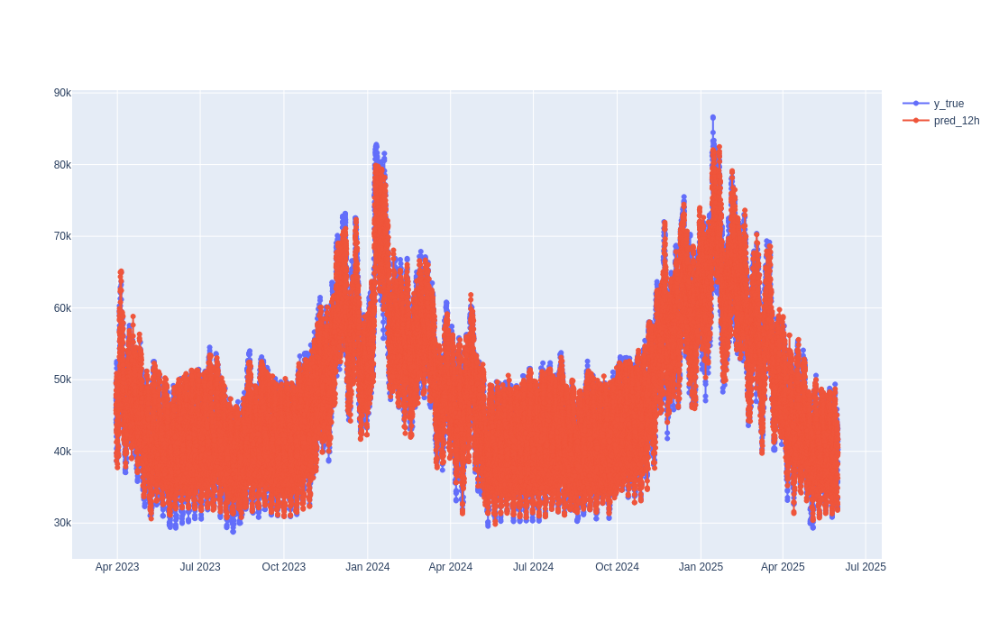

In [24]:
import plotly.graph_objects as go

target_time = cv_predictions["prediction_time"] + datetime.timedelta(
    hours=EXAMPLE_HORIZON
)


def plot_line(x, y):
    return go.Scatter(
        x=x,
        y=y,
        mode="lines+markers",
        name=y.name,
        hovertemplate="%{x|%Y-%m-%dT%H} (%{x|%A}): %{y}<extra></extra>",
    )


fig = go.Figure()
fig.add_trace(
    plot_line(target_time, cv_predictions[f"{EXAMPLE_HORIZON}h"].rename("y_true"))
)
fig.add_trace(plot_line(target_time, cv_predictions[f"pred_{EXAMPLE_HORIZON}h"]))
fig.update_layout(height=700)

## Multiple horizons

We now have a pipeline that makes predictions for 1 horizon. To predict
multiple horizons, we just need to make one prediction for each horizon and
group them in a single dataframe.

In [25]:
def concat_horizons(predictions):
    """
    Consolidate predictions of models for different horizons in one dataframe.
    """
    return pl.DataFrame({f"{h}h": v for h, v in predictions.items()})


def make_multi_horizon_pred(horizons):
    """
    Create a full DataOp for predicting the specified horizons.
    """
    X_y = prediction_time.skb.apply_func(get_X_y, load_mw_history, horizons)
    X = X_y["X"].skb.mark_as_X(cv=TimeSeriesSplitter())
    y = X_y["y"].skb.mark_as_y()
    predictions = {h: apply_predictor(X, y[f"{h}h"], h) for h in horizons}
    return skrub.deferred(concat_horizons)(predictions).skb.set_name(
        "pred_multi_horizon"
    )


# We inspect the pipeline on an example with only 3 horizons so that it is fast
# and reasonably easy to visualize. Later we will cross-validate a pipeline for
# all horizons between 1 and 25 hours.
pred = make_multi_horizon_pred((1, 12, 24))
pred

<pred_multi_horizon | Call 'concat_horizons'>
Result:
―――――――
shape: (36_614, 3)
┌──────────────┬──────────────┬──────────────┐
│ 1h           ┆ 12h          ┆ 24h          │
│ ---          ┆ ---          ┆ ---          │
│ f64          ┆ f64          ┆ f64          │
╞══════════════╪══════════════╪══════════════╡
│ 58470.624926 ┆ 63710.598957 ┆ 57627.01792  │
│ 57523.207626 ┆ 60953.768266 ┆ 57384.860129 │
│ 56674.484294 ┆ 59121.149807 ┆ 55509.057913 │
│ 60586.320339 ┆ 57701.101354 ┆ 55492.375828 │
│ 65958.911888 ┆ 57878.342    ┆ 58201.708414 │
│ …            ┆ …            ┆ …            │
│ 43342.742593 ┆ 39811.668905 ┆ 40834.833254 │
│ 40043.251214 ┆ 40959.601646 ┆ 40648.518483 │
│ 37616.259897 ┆ 42119.704795 ┆ 38972.886207 │
│ 35330.411239 ┆ 41618.828071 ┆ 36507.122951 │
│ 33399.475258 ┆ 40489.213973 ┆ 33837.760793 │
└──────────────┴──────────────┴──────────────┘

We want to define a scorer that will produce the Mean Absolute Percentage
Error (MAPE) for each of the horizons, and also averaged across horizons. To
easily try our metric function on actual values and debug it, we collect
ground truth and predictions on an example train/test split.

In [26]:
split = pred.skb.train_test_split()
learner = pred.skb.make_learner().fit(split["train"])
predicted_y_test = learner.predict(split["test"])
predicted_y_test

1h,12h,24h
f64,f64,f64
40750.713211,49408.413647,41199.416231
39126.816073,47535.660834,39772.920114
40232.806836,46241.13347,37967.900392
42053.772888,45233.733737,38785.231201
48377.53076,46727.42317,43126.761977
…,…,…
46449.695689,46668.050785,45868.515133
44700.38653,48364.684299,44070.802546
41716.607745,48844.389679,44070.802546


For multioutput regression, we can `mean_absolute_percentage_error` to return
the error for each target, without averaging:

In [27]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(
    split["y_test"], predicted_y_test, multioutput="raw_values"
)

array([0.01529499, 0.02700088, 0.02779699])

We will therefore use `multioutput='raw_values'` and return all the errors in
a dictionary, after adding the averaged error.

Once we have defined this function of true and predicted electricity loads,
(what scikit-learn calls a 'metric'), we wrap it in a 'scorer', a function
that takes an estimator, X and y. Scorers can return a single score, or a
dictionary mapping metric names (in our case 'mape_1h', 'mape_2h', ...) to
scores.

In [28]:
def mape(y_true, y_pred):
    average = mean_absolute_percentage_error(y_true, y_pred)
    detail = mean_absolute_percentage_error(y_true, y_pred, multioutput="raw_values")
    return {"mape_average": average} | {
        f"mape_{c}": float(s) for c, s in zip(y_true.columns, detail)
    }


def mape_scorer(estimator, X, y):
    return mape(y, estimator.predict(X))


# We set this as the default scorer on our pipeline.
pred = make_multi_horizon_pred((1, 12, 24)).skb.with_scoring(mape_scorer)
pred

<Scoring <Call 'concat_horizons'> (1 scorers)>
    This DataOp will be scored with:
      - <function mape_scorer at 0x7f3a3e10b600>
    Use .skb.cross_validate(…) or .skb.make_learner(…).score(…) to compute scores.
Result (preview of the learner's output, not the scores):
―――――――――――――――――――――――――――――――――――――――――――――――――――――――――
shape: (36_614, 3)
┌──────────────┬──────────────┬──────────────┐
│ 1h           ┆ 12h          ┆ 24h          │
│ ---          ┆ ---          ┆ ---          │
│ f64          ┆ f64          ┆ f64          │
╞══════════════╪══════════════╪══════════════╡
│ 58470.624926 ┆ 63710.598957 ┆ 57627.01792  │
│ 57523.207626 ┆ 60953.768266 ┆ 57384.860129 │
│ 56674.484294 ┆ 59121.149807 ┆ 55509.057913 │
│ 60586.320339 ┆ 57701.101354 ┆ 55492.375828 │
│ 65958.911888 ┆ 57878.342    ┆ 58201.708414 │
│ …            ┆ …            ┆ …            │
│ 43342.742593 ┆ 39811.668905 ┆ 40834.833254 │
│ 40043.251214 ┆ 40959.601646 ┆ 40648.518483 │
│ 37616.259897 ┆ 42119.704795 ┆ 38972.886207 │
│ 35330.411239 ┆ 41618.828071 ┆ 36507.122951 │
│ 33399.475258 ┆ 40489.213973 ┆ 33837.760793 │
└──────────────┴──────────────┴──────────────┘

In [29]:
print(pred.skb.describe_param_grid())

- cities: ['all', ['paris', 'lyon', 'marseille']]
  temperature_only: [True, False]
  learning_rate: choose_float(0.01, 0.7, log=True, name='learning_rate', default=0.1)
  loss: ['squared_error', 'poisson', 'gamma']
  max_leaf_nodes: choose_int(3, 300, log=True, name='max_leaf_nodes', default=30)



In [30]:
# run this if in an environment where it is possible to open a browser tab,
# useful for inspecting the whole pipeline:
#
# pred.skb.full_report()

Now that we have configured the scorer, we can check the score of our
pipeline on the example split:

In [31]:
pred.skb.make_learner().fit(split["train"]).score(split["test"])

{'mape_average': 0.0233642874865745,
 'mape_1h': 0.015294991776352556,
 'mape_12h': 0.027000877475185436,
 'mape_24h': 0.027796993208185513}

Finally we compute the full cross-validation.

In [32]:
pred.skb.cross_validate()

,fit_time,score_time,test_mape_average,test_mape_1h,test_mape_12h,test_mape_24h
0,0.753466,0.201990,0.023364,0.015295,0.027001,0.027797
1,0.835062,0.197041,0.020262,0.013800,0.022761,0.024226
2,0.918988,0.200414,0.018123,0.011775,0.021161,0.021434
3,0.949417,0.202268,0.017781,0.010924,0.020908,0.021512
4,1.044176,0.198102,0.017663,0.010510,0.021213,0.021266


Also, it is always good that our pipeline can make a prediction on some truly
left-out data, as a sanity check which could find bugs in the way we set it
up or did the cross-validation.

In [33]:
history_dates = raw_load_mw_history["time"].skb.preview()
history_dates.max()

datetime.datetime(2025, 6, 27, 14, 45, tzinfo=zoneinfo.ZoneInfo(key='UTC'))

In [34]:
new_date = (
    (history_dates - datetime.timedelta(seconds=1)).dt.truncate("1h")
    + datetime.timedelta(hours=1)
).max()
new_date

datetime.datetime(2025, 6, 27, 15, 0, tzinfo=zoneinfo.ZoneInfo(key='UTC'))

In [35]:
# fit on all available data
learner = pred.skb.make_learner(fitted=True)
future_pred = learner.predict({"start": new_date, "end": new_date})
future_pred

1h,12h,24h
f64,f64,f64
51090.198499,35124.663382,46721.235583


In [36]:
def transpose_pred(prediction_date, prediction):
    date = [
        prediction_date + datetime.timedelta(hours=int(c.removesuffix("h")))
        for c in prediction.columns
    ]
    load = prediction.row()
    return pl.DataFrame({"time": date, "load_mw": load})


future_pred_tall = transpose_pred(new_date, future_pred)

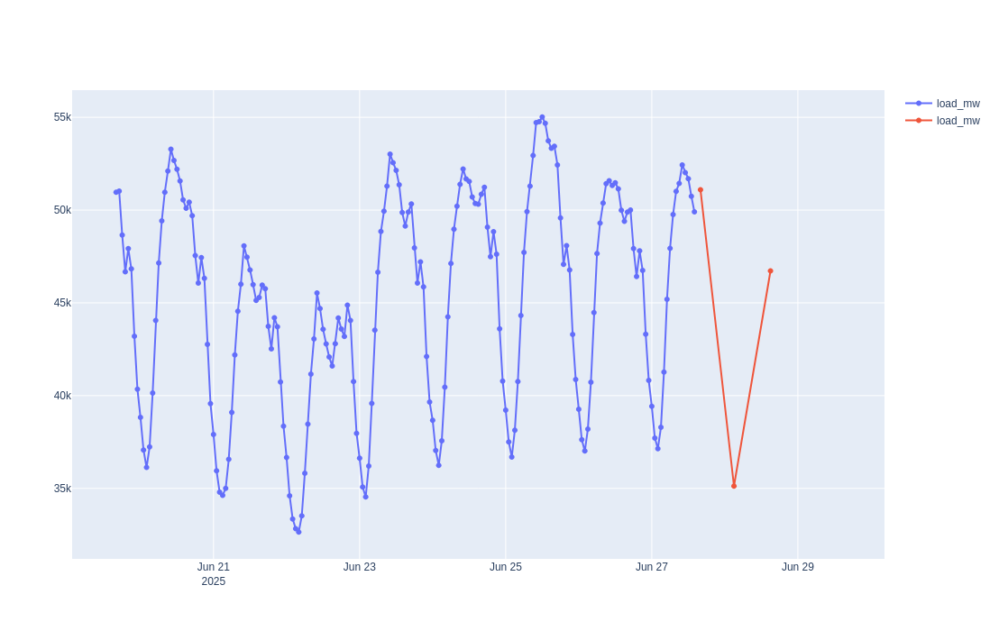

In [37]:
history_tail = load_mw_history.skb.preview().filter(
    pl.col("time") > new_date - datetime.timedelta(days=8)
)

fig = go.Figure()
fig.add_trace(plot_line(history_tail["time"], history_tail["load_mw"]))
fig.add_trace(plot_line(future_pred_tall["time"], future_pred_tall["load_mw"]))
fig.update_layout(height=700)

We now want to plot the true and predicted loads for the different horizons.
This is similar to what we did before; we just need to put all the
predictions and true loads for the different horizons in a single dataframe.

In [38]:
def concat_X_y_predictions(X_test, y_test, prediction):
    return pl.concat(
        [
            X_test,
            y_test,
            prediction.rename("pred_{}".format),
        ],
        how="horizontal",
    )


concat_X_y_predictions(split["X_test"], split["y_test"], predicted_y_test)

prediction_time,1h,12h,24h,pred_1h,pred_12h,pred_24h
"datetime[μs, UTC]",f64,f64,f64,f64,f64,f64
2023-03-30 00:00:00 UTC,40095.0,47371.0,42061.0,40750.713211,49408.413647,41199.416231
2023-03-30 01:00:00 UTC,38222.0,46050.0,39725.0,39126.816073,47535.660834,39772.920114
2023-03-30 02:00:00 UTC,39584.0,44420.0,38660.0,40232.806836,46241.13347,37967.900392
2023-03-30 03:00:00 UTC,44707.0,44031.0,40365.0,42053.772888,45233.733737,38785.231201
2023-03-30 04:00:00 UTC,49655.0,47063.0,45240.0,48377.53076,46727.42317,43126.761977
…,…,…,…,…,…,…
2023-09-13 19:00:00 UTC,44861.0,46278.0,47273.0,46449.695689,46668.050785,45868.515133
2023-09-13 20:00:00 UTC,44502.0,47818.0,44496.0,44700.38653,48364.684299,44070.802546
2023-09-13 21:00:00 UTC,43777.0,48615.0,44049.0,41716.607745,48844.389679,44070.802546


In [39]:
def cross_val_predict(data_op, environment=None):
    """
    Get cross-validated predictions for different horizons.
    """
    all_predictions, all_scores = [], []
    for i, split in enumerate(data_op.skb.iter_cv_splits(environment=environment)):
        prediction = (
            data_op.skb.make_learner().fit(split["train"]).predict(split["test"])
        )
        all_predictions.append(
            concat_X_y_predictions(
                split["X_test"], split["y_test"], prediction
            ).with_columns(split=pl.lit(i)),
        )
        split_mape = mape(split["y_test"], prediction)
        split_start = split["X_test"]["prediction_time"].min()
        fmt_mape = " ".join(
            f"{k.removeprefix('mape_')}: {v:.1%}" for k, v in split_mape.items()
        )
        print(f"{split_start:%Y-%m-%d}: {fmt_mape}")
        all_scores.append(split_mape | {"split": i})
    all_predictions = pl.concat(all_predictions, how="vertical")
    all_scores = pl.DataFrame(all_scores)
    return all_predictions, all_scores


cv_predictions, cv_scores = cross_val_predict(pred)
cv_scores

2023-03-30: average: 2.3% 1h: 1.5% 12h: 2.7% 24h: 2.8%
2023-09-14: average: 2.0% 1h: 1.4% 12h: 2.3% 24h: 2.4%
2024-02-29: average: 1.8% 1h: 1.2% 12h: 2.1% 24h: 2.1%
2024-08-15: average: 1.8% 1h: 1.1% 12h: 2.1% 24h: 2.2%
2025-01-30: average: 1.8% 1h: 1.1% 12h: 2.1% 24h: 2.1%


mape_average,mape_1h,mape_12h,mape_24h,split
f64,f64,f64,f64,i64
0.023364,0.015295,0.027001,0.027797,0
0.020262,0.0138,0.022761,0.024226,1
0.018123,0.011775,0.021161,0.021434,2
0.017781,0.010924,0.020908,0.021512,3
0.017663,0.01051,0.021213,0.021266,4


Now we have the predictions, we can plot them. We notice that the 1h horizon
qualitatively seems to stick better to the ground truth, which is expected
and also corresponds to what we see in the MAPE.

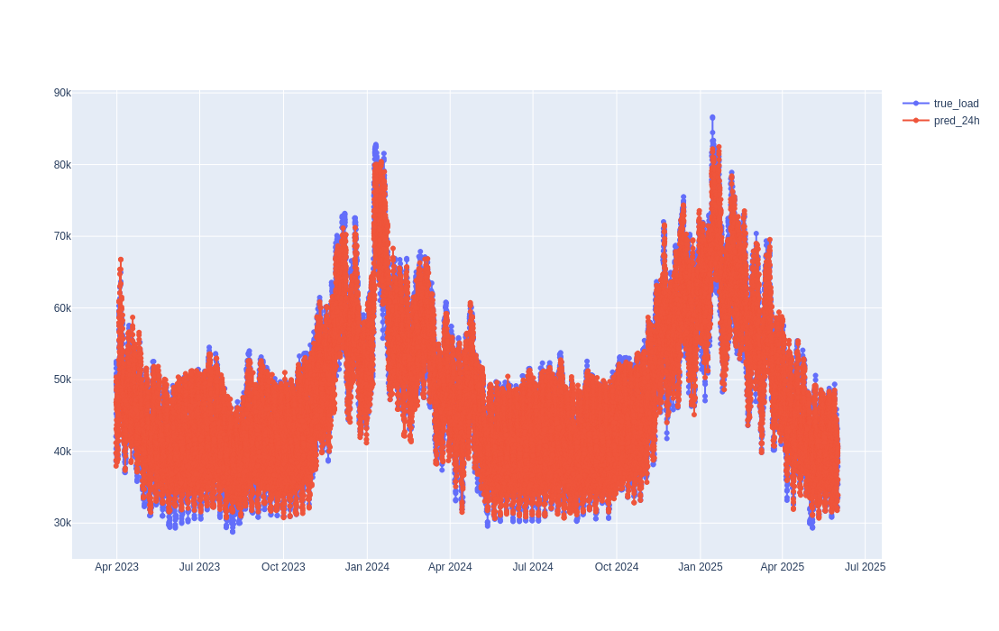

In [40]:
import re

import plotly.graph_objects as go


def plot_predictions(cv_predictions, horizons=None):
    if horizons is None:
        horizons = [
            int(m.group(1))
            for c in cv_predictions.columns
            if (m := re.match(r"^pred_(\d+)h$", c)) is not None
        ]
    fig = go.Figure()
    for i, h in enumerate(horizons):
        target_time = cv_predictions["prediction_time"] + datetime.timedelta(hours=h)
        if i == 0:
            fig.add_trace(
                plot_line(target_time, cv_predictions[f"{h}h"].rename("true_load"))
            )
        fig.add_trace(plot_line(target_time, cv_predictions[f"pred_{h}h"]))
    fig.update_layout(height=700)
    return fig


plot_predictions(cv_predictions, (24,))

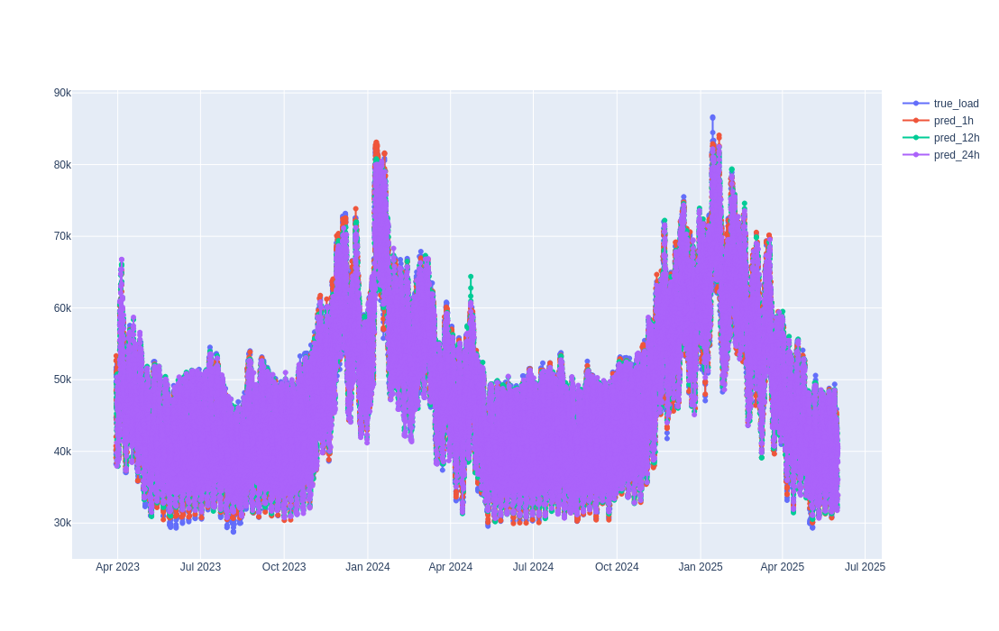

In [41]:
plot_predictions(cv_predictions)

We can save this pipeline for future reuse:

In [42]:
import pickle

with open("learner_3_horizons.pickle", "wb") as f:
    pickle.dump(pred.skb.make_learner(), f)

Finally, we run the cross-validation for all 24 horizons

In [43]:
HORIZONS = tuple(range(1, 25))

pred_24_horizons = make_multi_horizon_pred(HORIZONS).skb.with_scoring(mape_scorer)
cv_scores = pred_24_horizons.skb.cross_validate(verbose=1)
cv_scores

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.6s finished


,fit_time,score_time,test_mape_average,test_mape_1h,test_mape_2h,test_mape_3h,test_mape_4h,test_mape_5h,test_mape_6h,test_mape_7h,...,test_mape_15h,test_mape_16h,test_mape_17h,test_mape_18h,test_mape_19h,test_mape_20h,test_mape_21h,test_mape_22h,test_mape_23h,test_mape_24h
0,6.889888,1.758365,0.025946,0.015414,0.021215,0.024032,0.025786,0.025476,0.026225,0.026306,...,0.027383,0.027944,0.027197,0.027558,0.026801,0.026477,0.027826,0.027911,0.026748,0.027207
1,7.032226,1.796945,0.022386,0.013857,0.019046,0.020180,0.020516,0.021778,0.022027,0.022353,...,0.023635,0.023578,0.023481,0.023004,0.022899,0.023880,0.023496,0.023911,0.023689,0.024386
2,7.292212,1.758480,0.020760,0.011733,0.017641,0.019495,0.020486,0.020643,0.021179,0.021147,...,0.021792,0.021749,0.021621,0.021750,0.021561,0.021418,0.021374,0.021716,0.021493,0.022051
3,7.806081,1.734956,0.020354,0.010808,0.016819,0.019161,0.020501,0.020483,0.021017,0.020964,...,0.021142,0.021068,0.021285,0.021282,0.020755,0.021249,0.020961,0.021307,0.021415,0.021417
4,8.301367,1.753841,0.020023,0.010527,0.016714,0.019248,0.019607,0.019901,0.020301,0.020343,...,0.020893,0.020814,0.020527,0.021049,0.021376,0.020987,0.020616,0.020523,0.020715,0.021145


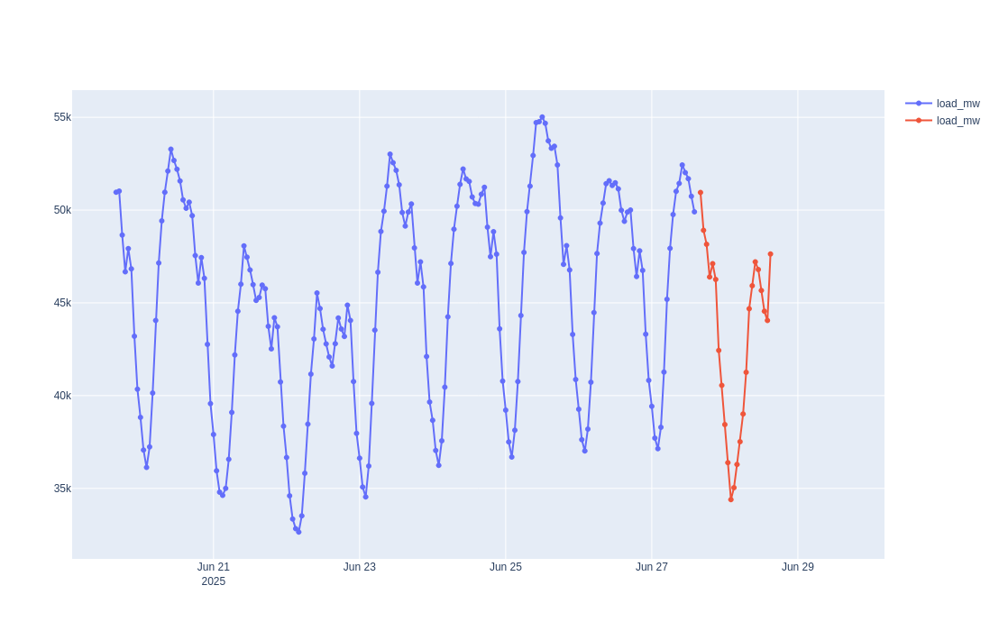

In [44]:
learner = pred_24_horizons.skb.make_learner(fitted=True)
future_pred = learner.predict({"start": new_date, "end": new_date})
future_pred_tall = transpose_pred(new_date, future_pred)
fig = go.Figure()
fig.add_trace(plot_line(history_tail["time"], history_tail["load_mw"]))
fig.add_trace(plot_line(future_pred_tall["time"], future_pred_tall["load_mw"]))
fig.update_layout(height=700)

We can plot horizon vs MAPE to see if shorter horizons are easier to predict:

Text(0, 0.5, 'MAPE')

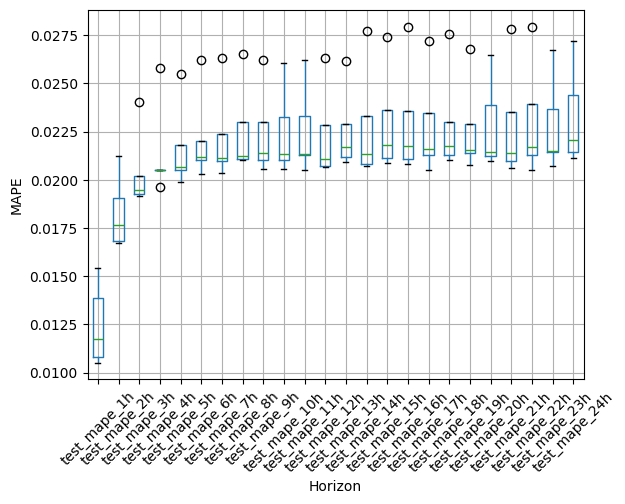

In [45]:
from matplotlib import pyplot as plt

cv_scores.filter(regex="test_mape_.*h").boxplot()
plt.xticks(rotation=45)
plt.xlabel("Horizon")
plt.ylabel("MAPE")

In [46]:
with open("learner_24_horizons.pickle", "wb") as f:
    pickle.dump(pred_24_horizons.skb.make_learner(), f)